## **U-Net accuracy assessment**

In [1]:
import json
import geopandas as gpd
from sklearn.metrics import jaccard_score

# custom functions imported from src
from src.raster_utilities import polygons_to_pixels, load_raster_by_window_corner
from src.plot import plot_confusion_matrix, plot_example_maps
from src.utilities import palette

### **Set configurations**

In [2]:
naip_filepath = "https://s3.msi.umn.edu/stlouis-estuary-habitat/NAIP_summer_mosaic_cropped.tif"
root_dir = "/home/lenkne/shared/StLouisRiver/"
data_stats_filepath = root_dir + "st_louis_augment_overlap_128/augment_stats.json"
pred_filepath = (root_dir + "/results/ensembles/" + "st_louis_naip_unet_ensemble_10mods_predict.tif")
all_polygons_filepath = root_dir + "/TrainingPolygons/PolygonsComb_07_09_2024.shp"
n_classes = 8
land_cover_classes, palette_dictionary = palette()

### **Quantitative accuracy assessment**

For quantitative accuracy assessment we use test polygons that have been withheld from the process at the beginning. 

In [3]:
all_polygons = gpd.read_file(all_polygons_filepath)

# identify test ids from stats file
spltiIndices = json.load(open(data_stats_filepath))["spltiIndices"]
test_ids = sum([spltiIndices[str(i)]["test"] for i in range(1, n_classes)], [])

test_gdf = all_polygons[all_polygons.index.isin(test_ids)]
print ("Number of test polygons: ", len(test_gdf))
print ("IDs of test polygons: ", test_ids)

Number of test polygons:  48
IDs of test polygons:  [13, 45, 47, 44, 17, 62, 88, 79, 94, 66, 130, 104, 131, 112, 118, 148, 158, 441, 172, 154, 182, 429, 164, 188, 257, 290, 205, 246, 227, 317, 270, 211, 291, 274, 219, 312, 362, 359, 365, 331, 343, 350, 370, 375, 403, 383, 389, 420]


In [4]:
y_true, y_pred = polygons_to_pixels(gdf=test_gdf, raster_filepath=pred_filepath, label_column="class")

We use a **confusion matrix** as a performance measurement for our machine learning model. It is a great visual and quantitative way to show model accuracy by class. It reveals which classes are more distinct and which ones are confused by model, indicating lower separability.

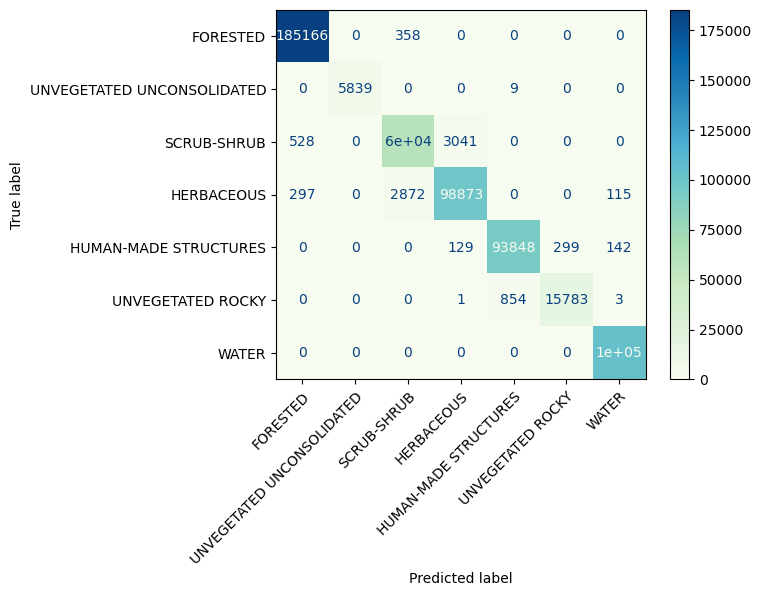

In [5]:
plot_confusion_matrix(true=y_true, pred=y_pred, display_labels=list(land_cover_classes))

Jaccard Score captures the degree of overlap between the "true" and the "predicted" and is a convenient and commonly used metric for image classification problems. For more information  see [Jaccard Score](https://scikit-learn.org/1.5/modules/generated/sklearn.metrics.jaccard_score.html). 

In [6]:
JS = jaccard_score(y_true, y_pred, average="macro")
print(f"Overall Jaccard Score = {JS:.3f}")

Overall Jaccard Score = 0.963


In [7]:
JSs_by_class = jaccard_score(y_true, y_pred, average=None)
for i, JS_class in enumerate(JSs_by_class):
    print (list(land_cover_classes)[i], f"{JS_class:.3f}")

FORESTED 0.994
UNVEGETATED UNCONSOLIDATED 0.998
SCRUB-SHRUB 0.898
HERBACEOUS 0.939
HUMAN-MADE STRUCTURES 0.985
UNVEGETATED ROCKY 0.932
WATER 0.997


### **Qualitative accuracy assessment**
Below we demonstrate samples of NAIP imagery in different parts of the study area, and the resulting classified maps predicted by an ensemble of U-Net models.

In [8]:
corner_coordinates_list = [
    (557198, 5169074), (560315, 5168835), (556677, 5168123), (561856, 5170988),
    (561343, 5172974), (565577, 5169399), (565812, 5175694), (565458, 5177967),
    (565236, 5174424), (573032, 5171902), (578223, 5170397), (556770, 5164164),
    (565031, 5171442), (560165, 5174716), (568653, 5181944), (555588, 5167532),
    (555631, 5172823), (553439, 5168588), (568108, 5178463), (574780, 5173631)
]
window_size = 2000

Corner coordinates:  557198 5169074


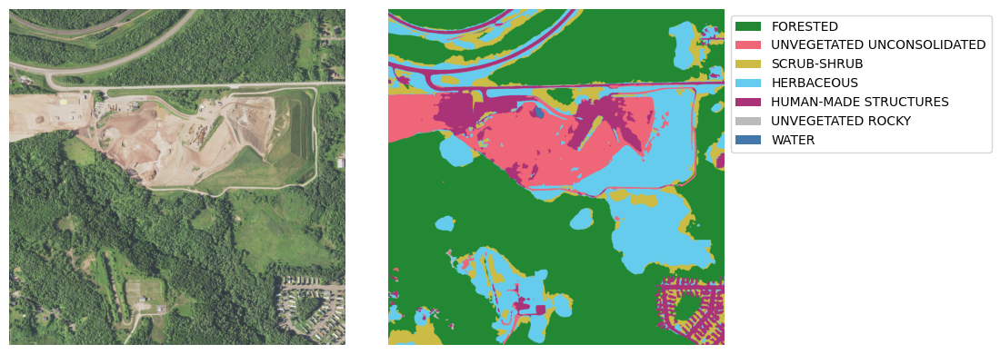

Corner coordinates:  560315 5168835


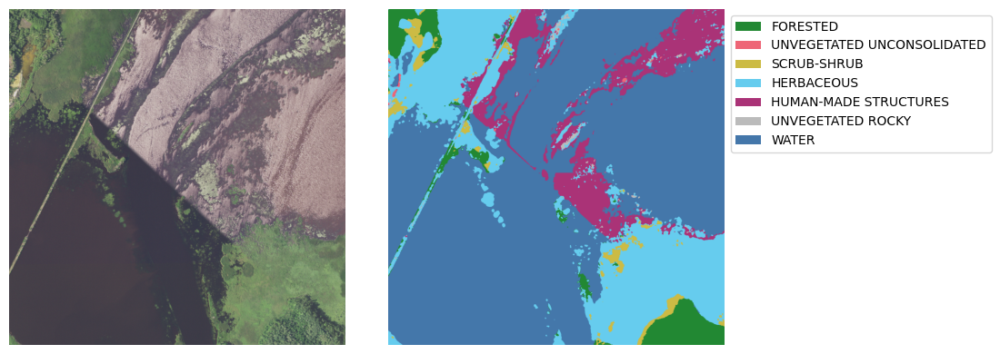

Corner coordinates:  556677 5168123


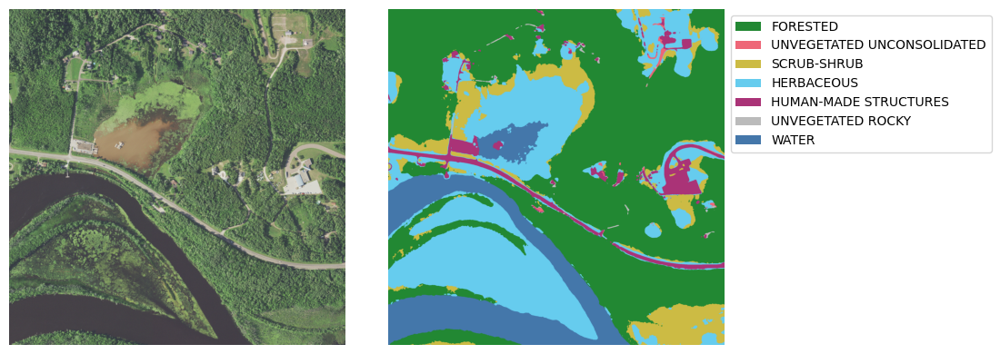

Corner coordinates:  561856 5170988


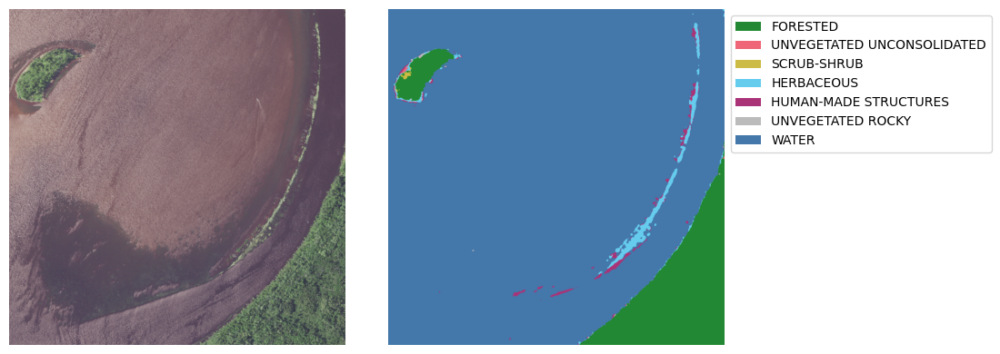

Corner coordinates:  561343 5172974


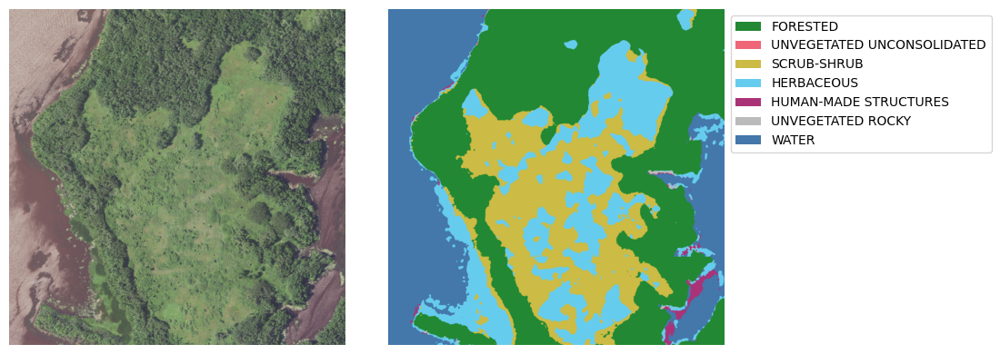

Corner coordinates:  565577 5169399


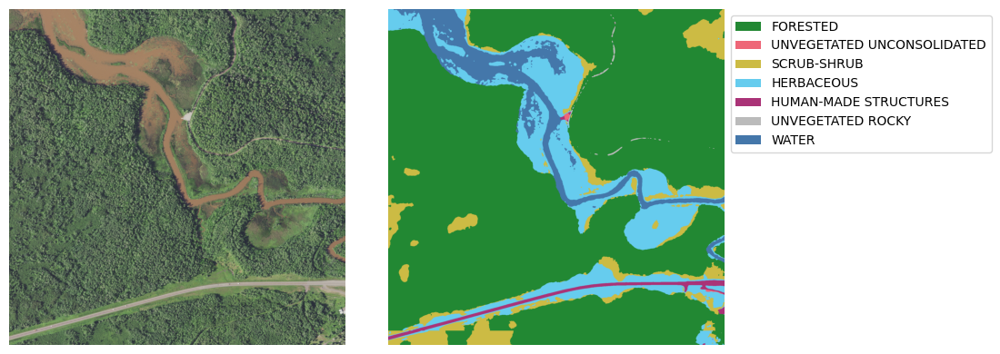

Corner coordinates:  565812 5175694


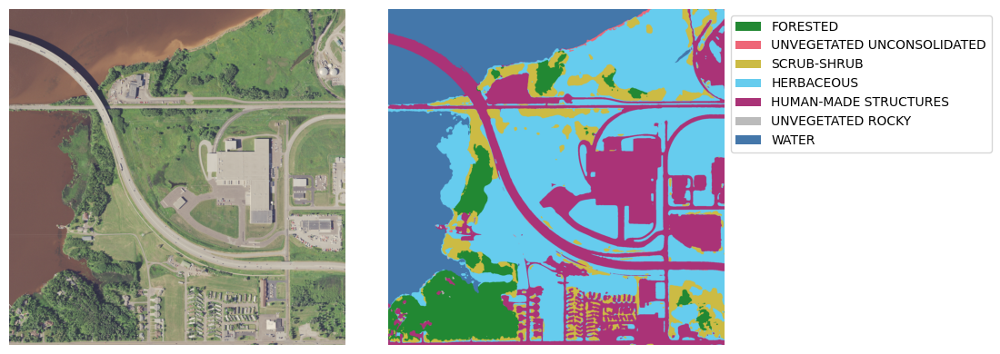

Corner coordinates:  565458 5177967


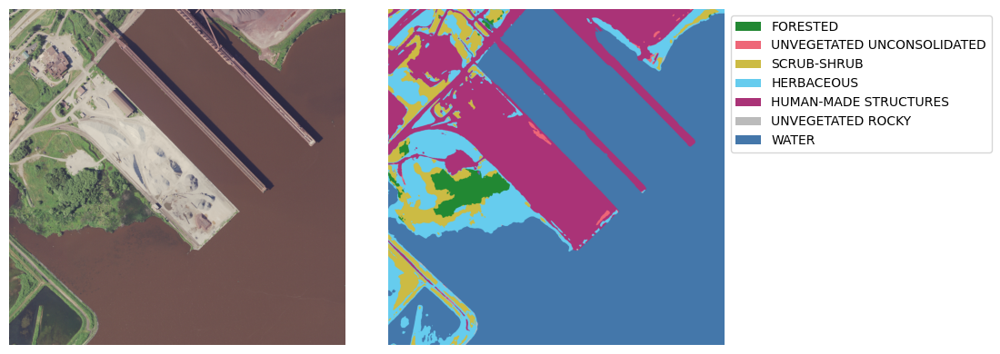

Corner coordinates:  565236 5174424


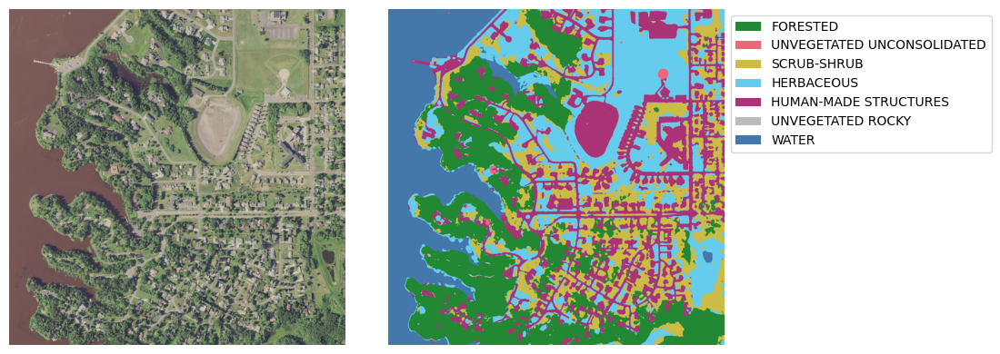

Corner coordinates:  573032 5171902


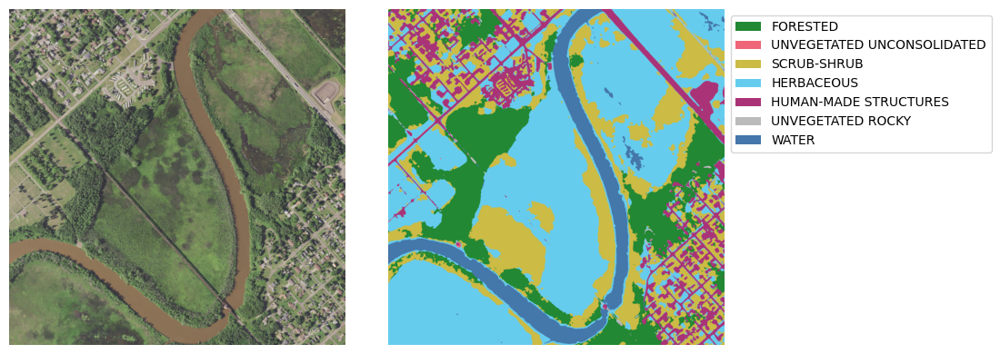

Corner coordinates:  578223 5170397


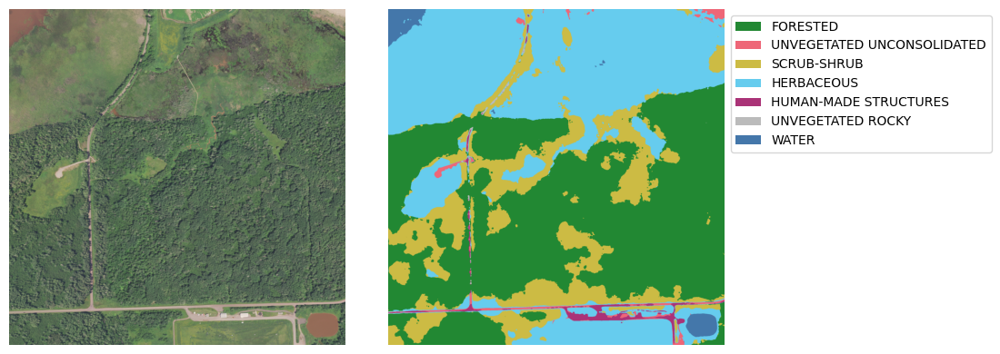

Corner coordinates:  556770 5164164


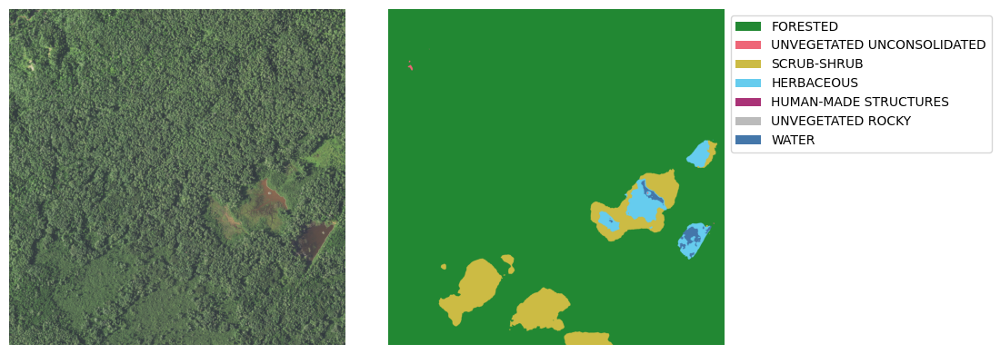

Corner coordinates:  565031 5171442


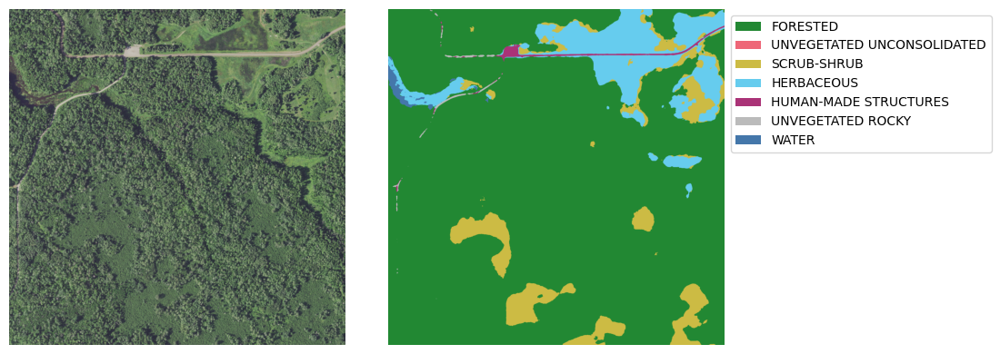

Corner coordinates:  560165 5174716


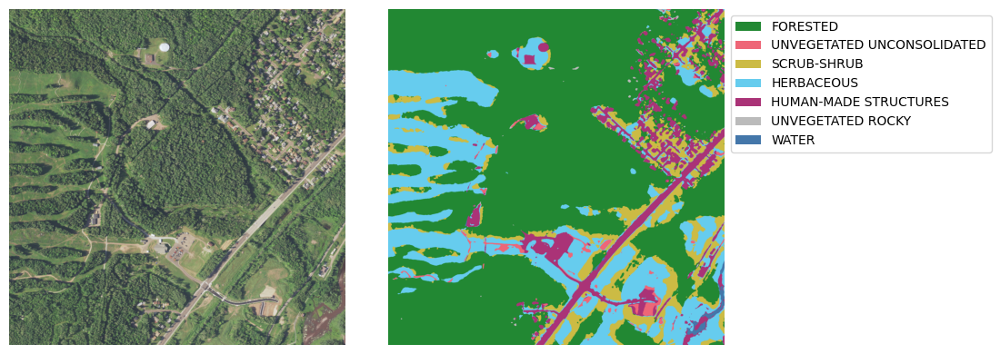

Corner coordinates:  568653 5181944


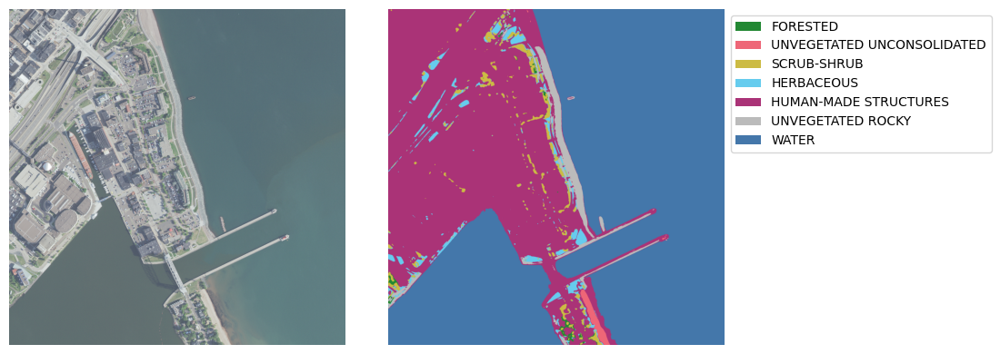

Corner coordinates:  555588 5167532


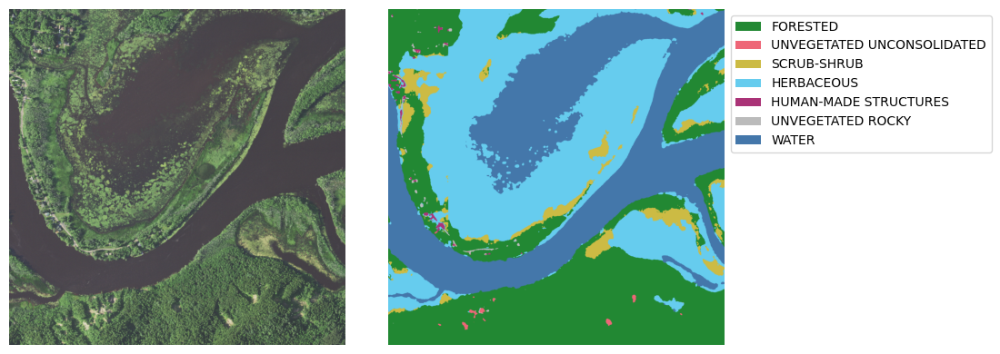

Corner coordinates:  555631 5172823


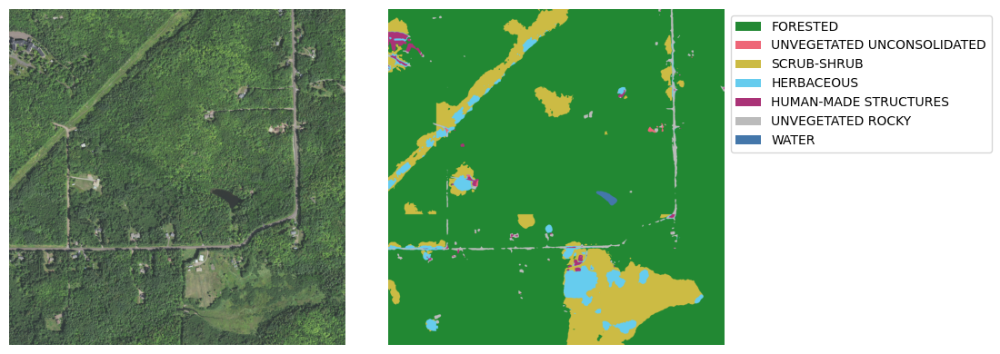

Corner coordinates:  553439 5168588


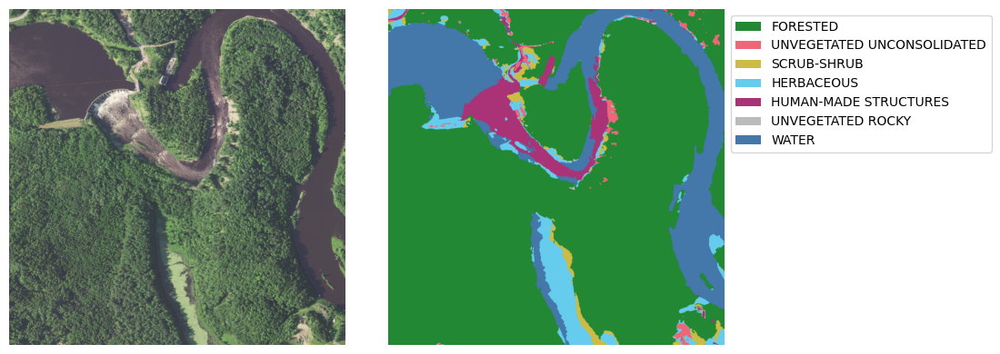

Corner coordinates:  568108 5178463


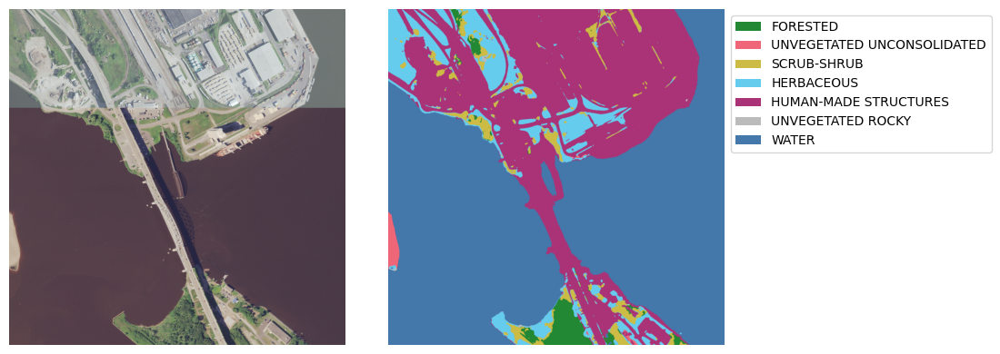

Corner coordinates:  574780 5173631


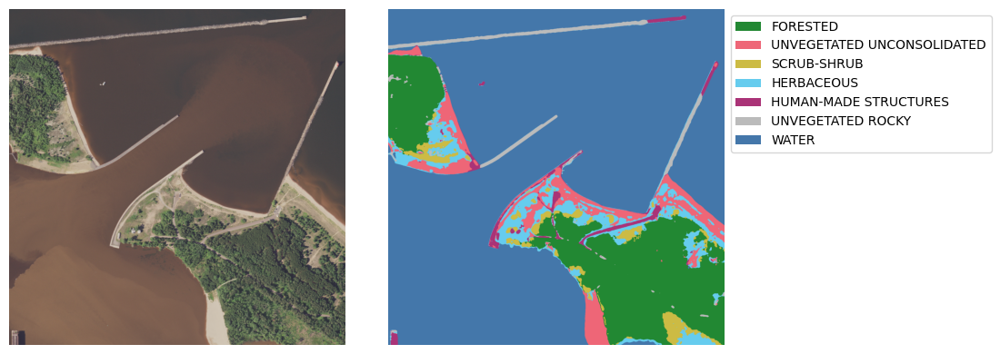

CPU times: user 1min 25s, sys: 6.42 s, total: 1min 31s
Wall time: 3min 19s


In [9]:
%%time
for i, (lon, lat) in enumerate(corner_coordinates_list):
    print ("Corner coordinates: ", lon, lat)
    naip = load_raster_by_window_corner(naip_filepath, lon, lat, window_size)
    pred = load_raster_by_window_corner(pred_filepath, lon, lat, window_size)
    plot_example_maps(rgb_array=naip[:,:,:-1], classified_array=pred[:,:,0],
                      palette=palette_dictionary, display_labels=list(land_cover_classes))